# Data Processing

The actual audio data is of 5GB. We've extracted only 30 birds samples out of 264 for the sake of implementation and split it into train and val using 80-20 split

In [1]:
#importing all libraries
import numpy as np
import pandas as pd
import seaborn as sns
import ast
import librosa
import plotly.express as px
import plotly.graph_objs as go
from collections import Counter
import matplotlib.pyplot as plt
from IPython.display import Audio

In [4]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

import shutil

Mounted at /content/drive


In [ ]:
#Only run once
# source_folder = '/content/drive/MyDrive/data'
# destination_folder = '/content/drive/MyDrive/converted_data'

# shutil.copytree(source_folder, destination_folder)

'/content/drive/MyDrive/converted_data'

Now the data is ready in our colab environment

In [ ]:
import warnings
warnings.filterwarnings('ignore')

## Data Visualization

In [ ]:
trainmeta_df = pd.read_csv("/content/drive/MyDrive/train_metadata.csv")
trainmeta_df.head()

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,license,rating,url,filename
0,abethr1,[],['song'],4.3906,38.2788,Turdus tephronotus,African Bare-eyed Thrush,Rolf A. de By,Creative Commons Attribution-NonCommercial-Sha...,4.0,https://www.xeno-canto.org/128013,abethr1/XC128013.ogg
1,abethr1,[],['call'],-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,3.5,https://www.xeno-canto.org/363501,abethr1/XC363501.ogg
2,abethr1,[],['song'],-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,3.5,https://www.xeno-canto.org/363502,abethr1/XC363502.ogg
3,abethr1,[],['song'],-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,5.0,https://www.xeno-canto.org/363503,abethr1/XC363503.ogg
4,abethr1,[],"['call', 'song']",-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,4.5,https://www.xeno-canto.org/363504,abethr1/XC363504.ogg


In [ ]:
x = trainmeta_df[trainmeta_df["primary_label"] == "afgfly1"]
x

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,license,rating,url,filename
356,afgfly1,[],['song'],-7.5253,34.8521,Bradornis microrhynchus,African Gray Flycatcher,Martin St-Michel,Creative Commons Attribution-NonCommercial-Sha...,3.0,https://www.xeno-canto.org/134487,afgfly1/XC134487.ogg
357,afgfly1,[],['call'],8.9200,40.0430,Bradornis microrhynchus,African Gray Flycatcher,Andrew Spencer,Creative Commons Attribution-NonCommercial-Sha...,5.0,https://www.xeno-canto.org/267773,afgfly1/XC267773.ogg
358,afgfly1,[],['call'],8.9200,40.0430,Bradornis microrhynchus,African Gray Flycatcher,Andrew Spencer,Creative Commons Attribution-NonCommercial-Sha...,5.0,https://www.xeno-canto.org/267774,afgfly1/XC267774.ogg
359,afgfly1,[],['call'],-1.5765,36.6316,Bradornis microrhynchus,African Gray Flycatcher,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,5.0,https://www.xeno-canto.org/344741,afgfly1/XC344741.ogg
360,afgfly1,"['combul2', 'kerspa2', 'ratcis1']","['call,begging call,juvenile']",-2.8145,37.4113,Bradornis microrhynchus,African Gray Flycatcher,Rory Nefdt,Creative Commons Attribution-NonCommercial-Sha...,3.5,https://www.xeno-canto.org/397762,afgfly1/XC397762.ogg
361,afgfly1,[],"['adult', 'call', 'sex uncertain']",-3.1481,36.6951,Bradornis microrhynchus,African Gray Flycatcher,isaac kilusu,Creative Commons Attribution-NonCommercial-Sha...,4.0,https://www.xeno-canto.org/609474,afgfly1/XC609474.ogg
362,afgfly1,[],"['call', 'juvenile', 'sex uncertain']",-3.1481,36.6951,Bradornis microrhynchus,African Gray Flycatcher,isaac kilusu,Creative Commons Attribution-NonCommercial-Sha...,5.0,https://www.xeno-canto.org/609492,afgfly1/XC609492.ogg
363,afgfly1,[],"['adult', 'call', 'sex uncertain']",-3.1481,36.6951,Bradornis microrhynchus,African Gray Flycatcher,isaac kilusu,Creative Commons Attribution-NonCommercial-Sha...,5.0,https://www.xeno-canto.org/609493,afgfly1/XC609493.ogg


In [ ]:
trainmeta_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16941 entries, 0 to 16940
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   primary_label     16941 non-null  object 
 1   secondary_labels  16941 non-null  object 
 2   type              16941 non-null  object 
 3   latitude          16714 non-null  float64
 4   longitude         16714 non-null  float64
 5   scientific_name   16941 non-null  object 
 6   common_name       16941 non-null  object 
 7   author            16941 non-null  object 
 8   license           16941 non-null  object 
 9   rating            16941 non-null  float64
 10  url               16941 non-null  object 
 11  filename          16941 non-null  object 
dtypes: float64(3), object(9)
memory usage: 1.6+ MB


In [ ]:

fig = px.histogram(trainmeta_df, x="primary_label", nbins=len(trainmeta_df["primary_label"].unique()))
fig.update_layout(title_text="Distribution of Primary Labels")
fig.show()

In [ ]:
secondary_df = trainmeta_df['secondary_labels'].str.replace('[','').str.replace(']','').str.replace('\'','').str.split(',', expand=True).stack().reset_index(level=1, drop=True).rename('secondary_label')
secondary_df = pd.merge(trainmeta_df.drop(columns=['secondary_labels']), secondary_df, left_index=True, right_index=True)

fig = px.histogram(secondary_df, x="secondary_label", title="Distribution of Secondary Labels")
fig.update_layout(xaxis_title="Secondary Label", yaxis_title="Count")
fig.show()

In [ ]:
# Flatten the list of labels in the "type" column
labels = [label.strip("[]'") for sublist in trainmeta_df['type'].apply(ast.literal_eval) for label in sublist]

# Count the occurrence of each label
label_counts = Counter(labels)

# Create a bar plot of the label counts
fig = px.bar(x=list(label_counts.keys()), y=list(label_counts.values()))
fig.update_layout(title_text="Distribution of Types")
fig.show()

In [ ]:
fig1 = px.box(trainmeta_df, y="latitude")
fig1.update_layout(title_text="Distribution of Latitude",
                   yaxis=dict(title="Latitude"))

# create a box plot for longitude
fig2 = px.box(trainmeta_df, y="longitude")
fig2.update_layout(title_text="Distribution of Longitude",
                   yaxis=dict(title="Longitude"))

# create a box plot for rating
fig3 = px.box(trainmeta_df, y="rating")
fig3.update_layout(title_text="Distribution of Ratings",
                   yaxis=dict(title="Rating"))

# show the figures
fig1.show()
fig2.show()
fig3.show()

In [ ]:
fig = px.histogram(trainmeta_df, x="scientific_name", nbins=len(trainmeta_df["scientific_name"].unique()))
fig.update_layout(title_text="Distribution of Scientific Names")
fig.show()

In [ ]:
fig = px.histogram(trainmeta_df, x="common_name", nbins=len(trainmeta_df["common_name"].unique()))
fig.update_layout(title_text="Distribution of Common Names")
fig.show()

In [ ]:
fig = px.histogram(trainmeta_df, x="author", nbins=len(trainmeta_df["author"].unique()))
fig.update_layout(title_text="Distribution of Authors")
fig.show()

In [ ]:
fig = px.histogram(trainmeta_df, x="rating", nbins=len(trainmeta_df["rating"].unique()) , color_discrete_sequence=['red'])
fig.update_layout(title_text="Distribution of Ratings")
fig.show()

In [ ]:
# drop columns from correlation matrix
corr = trainmeta_df.corr()

# create correlation heatmap
fig = px.imshow(corr,
                labels=dict(x="Columns", y="Columns", color="Correlation"),
                x=corr.columns,
                y=corr.columns,
                color_continuous_scale='RdBU',
                zmin=-1,
                zmax=1,
                title="Correlation Heatmap")

# add text annotations
annotations = []
for i, row in enumerate(corr.values):
    for j, value in enumerate(row):
        text = '{:.2f}'.format(value)
        annotations.append(dict(x=corr.columns[j], y=corr.columns[i], text=text, showarrow=False))

fig.update_layout(width=800, height=800)
fig.update_traces(showscale=True, colorbar_thickness=25, colorbar_len=0.75)
fig.update_layout(margin=dict(l=50, r=50, b=100, t=100, pad=4))
fig.update_layout(annotations=annotations)
fig.show()

In [ ]:
fig = px.scatter(trainmeta_df, x="longitude", y="latitude", color="common_name")
fig.update_layout(title="Distribution of Recordings by Location")
fig.show()

In [ ]:
fig = px.scatter_mapbox(trainmeta_df, lat="latitude", lon="longitude", color="common_name",
                        hover_name="filename", hover_data=["common_name", "author", "rating"],
                        zoom=3, height=500)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [ ]:
fig = px.density_mapbox(trainmeta_df, lat='latitude', lon='longitude', radius=10,
                        center=dict(lat=47.6, lon=-122.3), zoom=7,
                        mapbox_style="stamen-terrain")
fig.update_layout(title_text="Distribution of Bird Sightings")
fig.show()

**EBird Taxonomy**

In [ ]:
train_species_df = pd.read_csv("/content/drive/MyDrive/eBird_Taxonomy_v2021.csv")
train_species_df.head()

,TAXON_ORDER,CATEGORY,SPECIES_CODE,PRIMARY_COM_NAME,SCI_NAME,ORDER1,FAMILY,SPECIES_GROUP,REPORT_AS
0,1,species,ostric2,Common Ostrich,Struthio camelus,Struthioniformes,Struthionidae (Ostriches),Ostriches,NaN
1,6,species,ostric3,Somali Ostrich,Struthio molybdophanes,Struthioniformes,Struthionidae (Ostriches),NaN,NaN
2,7,slash,y00934,Common/Somali Ostrich,Struthio camelus/molybdophanes,Struthioniformes,Struthionidae (Ostriches),NaN,NaN
3,8,species,grerhe1,Greater Rhea,Rhea americana,Rheiformes,Rheidae (Rheas),Rheas,NaN
4,14,species,lesrhe2,Lesser Rhea,Rhea pennata,Rheiformes,Rheidae (Rheas),NaN,NaN


In [ ]:
# Histogram of the taxonomic order counts
fig1 = px.histogram(train_species_df, x="TAXON_ORDER", color_discrete_sequence=['aquamarine'])
fig1.update_layout(title_text="Distribution of Taxonomic Orders")

# Bar plot of the species group counts
# Box plot of the taxonomic order counts by category
fig3 = px.box(train_species_df, x="CATEGORY", y="TAXON_ORDER", color_discrete_sequence=['red'])
fig3.update_layout(title_text="Taxonomic Order Distribution by Category")

# Scatter plot of the taxonomic order counts by family
fig4 = px.scatter(train_species_df, x="FAMILY", y="TAXON_ORDER")
fig4.update_layout(title_text="Taxonomic Order Distribution by Family")

# Show the plots
fig1.show()
fig3.show()
fig4.show()

## Audio Exploration

**Function to perform all the analysis on a single bird species**

In [ ]:
def audio_eda(audio_path):

    # Load an audio file
    samples, sample_rate = librosa.load(audio_path)

    # Visualize the waveform
    plt.figure(figsize=(14, 5))
    librosa.display.waveshow(samples, sr=sample_rate)
    plt.title('Waveform')

    # Compute the spectrogram
    spectrogram = librosa.stft(samples)
    spectrogram_db = librosa.amplitude_to_db(abs(spectrogram))

    # Visualize the spectrogram
    plt.figure(figsize=(14, 5))
    librosa.display.specshow(spectrogram_db, sr=sample_rate, x_axis='time', y_axis='log')
    plt.colorbar(format='%+2.0f dB')
    plt.title('Spectrogram (dB)')

    # Compute the mel spectrogram


    # Visualize the mel spectrogram
    S = librosa.feature.melspectrogram(y=samples, sr=sample_rate)

    # Visualize mel spectrogram
    plt.figure(figsize=(10, 4))
    librosa.display.specshow(librosa.power_to_db(S, ref=np.max), y_axis='mel', fmax=8000, x_axis='time')
    plt.colorbar(format='%+2.0f dB')
    plt.title('Mel spectrogram')
    plt.tight_layout()


    # Compute the chromagram
    chromagram = librosa.feature.chroma_stft( y = samples , sr = sample_rate)

    # Visualize the chromagram
    plt.figure(figsize=(14, 5))
    librosa.display.specshow(chromagram, sr=sample_rate, x_axis='time', y_axis='chroma')
    plt.colorbar()
    plt.title('Chromagram')

    # Compute the MFCCs
    mfccs = librosa.feature.mfcc(y=samples, sr=sample_rate, n_mfcc=13)

    # Visualize the MFCCs
    plt.figure(figsize=(14, 5))
    librosa.display.specshow(mfccs, sr=sample_rate, x_axis='time')
    plt.colorbar()
    plt.title('MFCCs')

    # Show the plots
    display(Audio(samples, rate=sample_rate))
    plt.show()

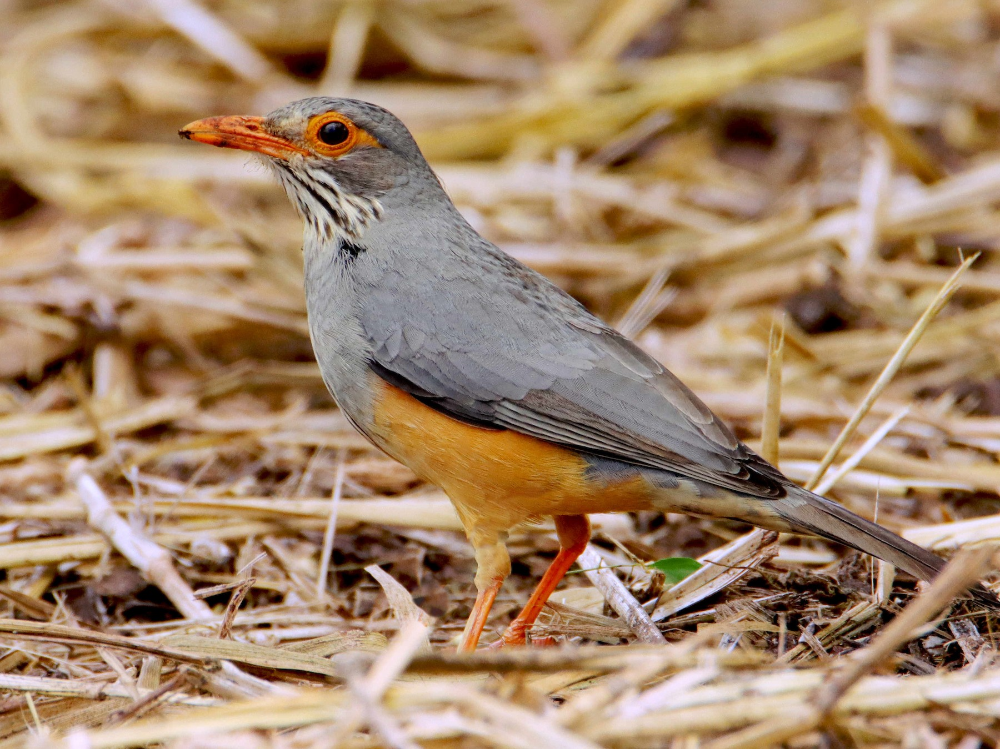

**Primary Label : abethr1**

**Scientific Name : Turdus tephronotus**

**Common Name: African Bare-eyed Thrush**

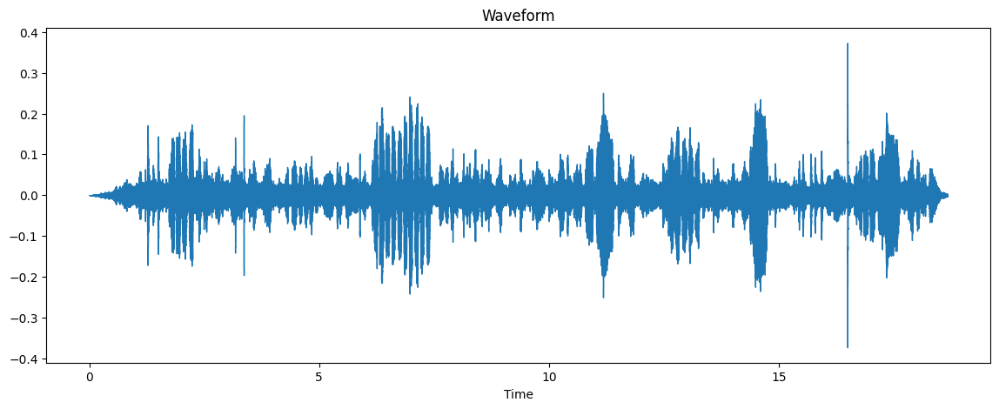

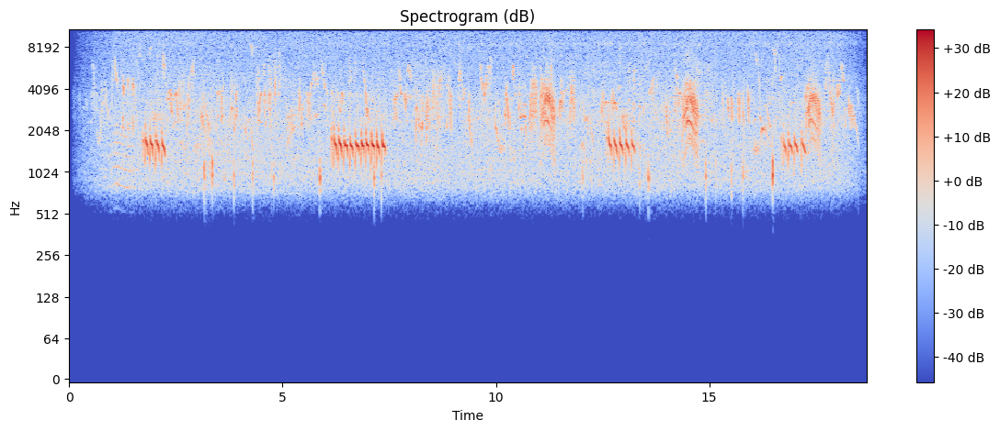

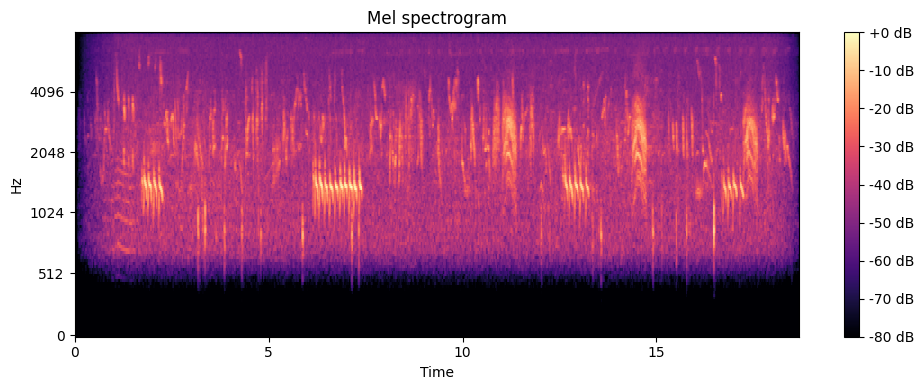

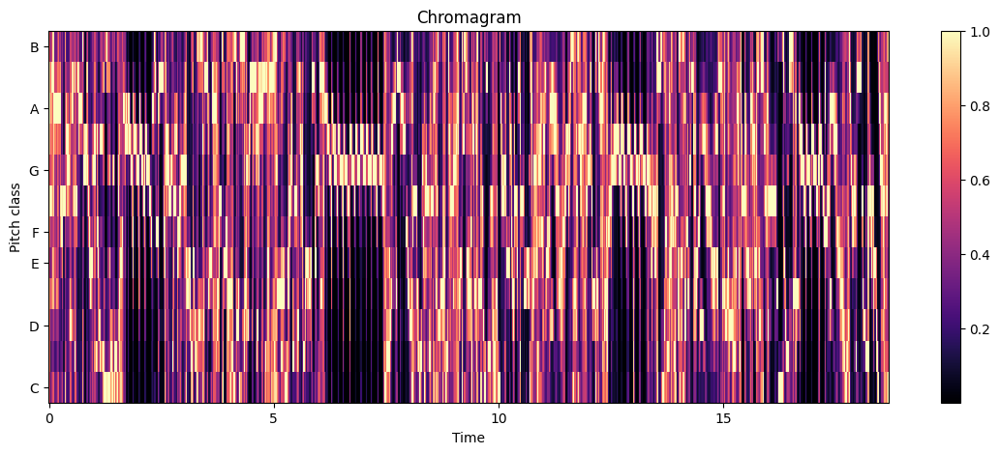

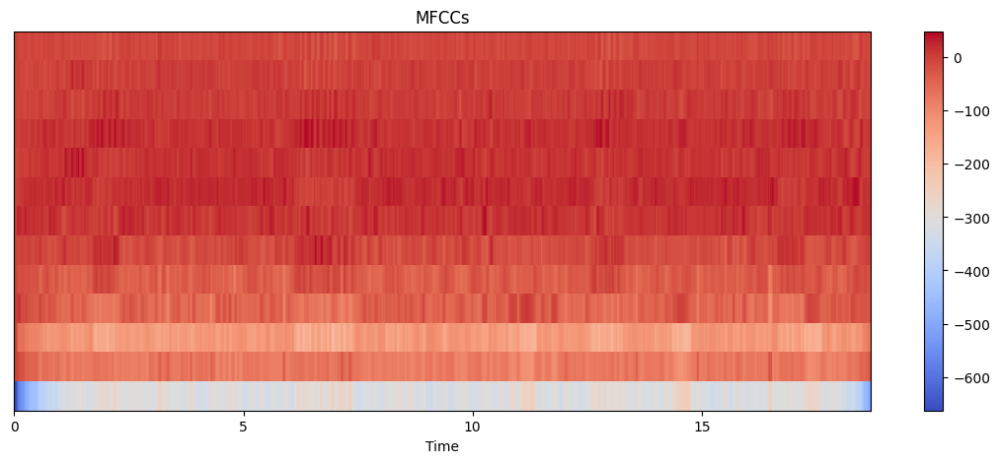

In [ ]:
audio_eda('/content/drive/MyDrive/data/train/abethr1/XC363501.ogg')

## Convert Audio Files

In [ ]:
!pip install pydub

In [ ]:
from pydub import AudioSegment
import os
from google.colab import files
import zipfile

# Function to convert .ogg to .mp3
def convert_to_mp3(input_folder, output_folder):
    # zip_filename = "/content/converted_data_mp3.zip"

    for file in os.listdir(input_folder):
        if file.endswith(".ogg"):
            ogg_path = os.path.join(input_folder, file)
            mp3_path = os.path.join(output_folder, file.replace(".ogg", ".mp3"))
            audio = AudioSegment.from_file(ogg_path, format="ogg")
            audio.export(mp3_path, format="mp3")

    # Download the output folder
    shutil.make_archive(output_folder, 'zip', output_folder)
    files.download(output_folder + '.zip')

# Example usage
input_folder = "/content/drive/MyDrive/converted_data"
output_folder = "/content/drive/MyDrive/converted_data"

convert_to_mp3(input_folder, output_folder)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

The above code converts the data files into .mp3 or .wav based on your requirement.

But here we're proceeding with .ogg format itself due to large data available.

## Extract Mel-Frequency Cepstral Coefficients (MFCC)

In [43]:
!pip install resampy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 12.9 MB/s eta 0:00:00


In [44]:
import librosa
import librosa.display
import IPython.display as ipd
import os
import resampy
import numpy as np

In [45]:
for file in os.listdir('/content/drive/MyDrive/data/train/abethr1'):
    print(file)

XC379322.ogg
XC639039.ogg
XC467122.ogg
XC756300.ogg
XC363502.ogg
XC363501.ogg
XC363504.ogg
XC432639.ogg
XC585802.ogg
XC467121.ogg
XC363503.ogg
XC616997.ogg


In [46]:
ipd.Audio('/content/drive/MyDrive/data/train/abethr1/XC639039.ogg')

In [47]:
#Funtionn to extract MFCCs
def feature_extraction(file_path):
    # load the audio file
    x, sample_rate = librosa.load(file_path, res_type='kaiser_fast')
    # extract features from the audio
    mfcc = np.mean(librosa.feature.mfcc(y=x, sr=sample_rate, n_mfcc=50).T, axis=0)

    return mfcc

In [50]:
#Run Once
features = {}
directory = '/content/drive/MyDrive/data/train/'

for subdirectory in os.listdir(directory):
    subdirectory_path = os.path.join(directory, subdirectory)
    if os.path.isdir(subdirectory_path):
        for audio in os.listdir(subdirectory_path):
            audio_path = os.path.join(subdirectory_path, audio)
            filenames = os.path.join(subdirectory,audio)
            features[filenames] = feature_extraction(audio_path).mean()

In [ ]:
audio_path

'/content/drive/MyDrive/data/train/afecuc1/XC138032.ogg'

In [ ]:
features

{'yespet1/XC602619.ogg': -8.802876,
 'yespet1/XC393627.ogg': -8.772148,
 'yespet1/XC630279.ogg': -9.683273,
 'yespet1/XC392980.ogg': -7.0179763,
 'yespet1/XC602618.ogg': -8.211981,
 'yespet1/XC610331.ogg': -4.7703996,
 'yespet1/XC364377.ogg': -7.9610095,
 'yespet1/XC602617.ogg': -7.8554134,
 'yespet1/XC294872.ogg': -14.947549,
 'yespet1/XC363499.ogg': -14.367504,
 'yespet1/XC697686.ogg': -9.218152,
 'yespet1/XC692101.ogg': -4.607768,
 'pitwhy/XC269921.ogg': -14.161483,
 'pitwhy/XC618468.ogg': -2.8457136,
 'pitwhy/XC428743.ogg': -8.1948595,
 'pitwhy/XC459428.ogg': -12.127994,
 'pitwhy/XC618455.ogg': -3.2840686,
 'pitwhy/XC444815.ogg': -13.718241,
 'pitwhy/XC454399.ogg': -7.062816,
 'pitwhy/XC614158.ogg': -11.373683,
 'pitwhy/XC674377.ogg': -7.655443,
 'pitwhy/XC540419.ogg': -11.597426,
 'pitwhy/XC247175.ogg': -10.2399,
 'pitwhy/XC626803.ogg': -10.887487,
 'pitwhy/XC618472.ogg': -3.6699853,
 'pitwhy/XC262808.ogg': -14.5109215,
 'pitwhy/XC707024.ogg': -15.064073,
 'pitwhy/XC430412.ogg': -

In [ ]:
features.keys()

dict_keys(['yespet1/XC602619.ogg', 'yespet1/XC393627.ogg', 'yespet1/XC630279.ogg', 'yespet1/XC392980.ogg', 'yespet1/XC602618.ogg', 'yespet1/XC610331.ogg', 'yespet1/XC364377.ogg', 'yespet1/XC602617.ogg', 'yespet1/XC294872.ogg', 'yespet1/XC363499.ogg', 'yespet1/XC697686.ogg', 'yespet1/XC692101.ogg', 'pitwhy/XC269921.ogg', 'pitwhy/XC618468.ogg', 'pitwhy/XC428743.ogg', 'pitwhy/XC459428.ogg', 'pitwhy/XC618455.ogg', 'pitwhy/XC444815.ogg', 'pitwhy/XC454399.ogg', 'pitwhy/XC614158.ogg', 'pitwhy/XC674377.ogg', 'pitwhy/XC540419.ogg', 'pitwhy/XC247175.ogg', 'pitwhy/XC626803.ogg', 'pitwhy/XC618472.ogg', 'pitwhy/XC262808.ogg', 'pitwhy/XC707024.ogg', 'pitwhy/XC430412.ogg', 'pitwhy/XC364315.ogg', 'pitwhy/XC728201.ogg', 'pitwhy/XC187123.ogg', 'pitwhy/XC400040.ogg', 'pitwhy/XC618470.ogg', 'pitwhy/XC246600.ogg', 'pitwhy/XC539795.ogg', 'pitwhy/XC246598.ogg', 'pitwhy/XC749038.ogg', 'pitwhy/XC627672.ogg', 'pitwhy/XC137938.ogg', 'pitwhy/XC604506.ogg', 'pitwhy/XC618475.ogg', 'pitwhy/XC532765.ogg', 'pitwhy/XC1

Now we have a MFC coefficient for every audio file.. which we can use to predict the birds species

In [ ]:
import pandas as pd

# Creating a dataframe with the features dictionary
df = pd.DataFrame(list(features.items()), columns=['filename', 'MFCC'])

In [ ]:
df.to_csv("features_mfccs.csv")

# Feature Engineering

In [ ]:
train_metadata = pd.read_csv("/content/drive/MyDrive/train_metadata.csv")

In [ ]:
train_metadata.head(10)

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,license,rating,url,filename
0,abethr1,[],['song'],4.3906,38.2788,Turdus tephronotus,African Bare-eyed Thrush,Rolf A. de By,Creative Commons Attribution-NonCommercial-Sha...,4.0,https://www.xeno-canto.org/128013,abethr1/XC128013.ogg
1,abethr1,[],['call'],-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,3.5,https://www.xeno-canto.org/363501,abethr1/XC363501.ogg
2,abethr1,[],['song'],-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,3.5,https://www.xeno-canto.org/363502,abethr1/XC363502.ogg
3,abethr1,[],['song'],-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,5.0,https://www.xeno-canto.org/363503,abethr1/XC363503.ogg
4,abethr1,[],"['call', 'song']",-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,4.5,https://www.xeno-canto.org/363504,abethr1/XC363504.ogg
5,abethr1,['rbsrob1'],['song'],-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,3.5,https://www.xeno-canto.org/379322,abethr1/XC379322.ogg
6,abethr1,[],"['call', 'song']",-2.9965,37.6244,Turdus tephronotus,African Bare-eyed Thrush,isaac kilusu,Creative Commons Attribution-NonCommercial-Sha...,3.0,https://www.xeno-canto.org/432639,abethr1/XC432639.ogg
7,abethr1,[],['song'],-4.0904,37.8807,Turdus tephronotus,African Bare-eyed Thrush,Peter Ericsson,Creative Commons Attribution-NonCommercial-Sha...,5.0,https://www.xeno-canto.org/467121,abethr1/XC467121.ogg
8,abethr1,[],['song'],-4.0904,37.8807,Turdus tephronotus,African Bare-eyed Thrush,Peter Ericsson,Creative Commons Attribution-NonCommercial-Sha...,5.0,https://www.xeno-canto.org/467122,abethr1/XC467122.ogg
9,abethr1,[],"['adult', 'sex uncertain', 'song']",4.8403,38.6988,Turdus tephronotus,African Bare-eyed Thrush,Barry Edmonston,Creative Commons Attribution-NonCommercial-Sha...,4.0,https://www.xeno-canto.org/531557,abethr1/XC531557.ogg


In [ ]:
train_metadata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16941 entries, 0 to 16940
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   primary_label     16941 non-null  object 
 1   secondary_labels  16941 non-null  object 
 2   type              16941 non-null  object 
 3   latitude          16714 non-null  float64
 4   longitude         16714 non-null  float64
 5   scientific_name   16941 non-null  object 
 6   common_name       16941 non-null  object 
 7   author            16941 non-null  object 
 8   license           16941 non-null  object 
 9   rating            16941 non-null  float64
 10  url               16941 non-null  object 
 11  filename          16941 non-null  object 
dtypes: float64(3), object(9)
memory usage: 1.6+ MB


In [ ]:
metadata = train_metadata.drop(['secondary_labels','author','license','rating','url'], axis = 1)
metadata.head()

,primary_label,type,latitude,longitude,scientific_name,common_name,filename
0,abethr1,['song'],4.3906,38.2788,Turdus tephronotus,African Bare-eyed Thrush,abethr1/XC128013.ogg
1,abethr1,['call'],-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,abethr1/XC363501.ogg
2,abethr1,['song'],-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,abethr1/XC363502.ogg
3,abethr1,['song'],-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,abethr1/XC363503.ogg
4,abethr1,"['call', 'song']",-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,abethr1/XC363504.ogg


In [ ]:
final_metadata = pd.merge(df,metadata, on='filename', how='inner')

In [ ]:
final_metadata.head(10)

,filename,MFCC,primary_label,type,latitude,longitude,scientific_name,common_name
0,yespet1/XC602619.ogg,-8.802876,yespet1,"['adult', 'call', 'sex uncertain']",-2.9858,37.5975,Gymnoris pyrgita,Yellow-spotted Bush Sparrow
1,yespet1/XC393627.ogg,-8.772148,yespet1,['call'],-2.9965,37.6244,Gymnoris pyrgita,Yellow-spotted Bush Sparrow
2,yespet1/XC630279.ogg,-9.683273,yespet1,"['adult', 'alarm call', 'sex uncertain']",-2.9858,37.5975,Gymnoris pyrgita,Yellow-spotted Bush Sparrow
3,yespet1/XC392980.ogg,-7.017976,yespet1,['call'],-2.9965,37.6244,Gymnoris pyrgita,Yellow-spotted Bush Sparrow
4,yespet1/XC602618.ogg,-8.211981,yespet1,"['adult', 'call', 'sex uncertain']",-2.9858,37.5975,Gymnoris pyrgita,Yellow-spotted Bush Sparrow
5,yespet1/XC610331.ogg,-4.770400,yespet1,"['adult', 'call', 'sex uncertain']",-2.9858,37.5975,Gymnoris pyrgita,Yellow-spotted Bush Sparrow
6,yespet1/XC364377.ogg,-7.961010,yespet1,['song'],-2.9604,38.0864,Gymnoris pyrgita,Yellow-spotted Bush Sparrow
7,yespet1/XC602617.ogg,-7.855413,yespet1,"['adult', 'call', 'sex uncertain']",-2.9858,37.5975,Gymnoris pyrgita,Yellow-spotted Bush Sparrow
8,yespet1/XC294872.ogg,-14.947549,yespet1,['call'],4.8636,39.3089,Gymnoris pyrgita,Yellow-spotted Bush Sparrow
9,yespet1/XC363499.ogg,-14.367504,yespet1,['call'],-1.5107,37.0613,Gymnoris pyrgita,Yellow-spotted Bush Sparrow


In [ ]:
final_metadata

,filename,MFCC,primary_label,type,latitude,longitude,scientific_name,common_name
0,yespet1/XC602619.ogg,-8.802876,yespet1,"['adult', 'call', 'sex uncertain']",-2.9858,37.5975,Gymnoris pyrgita,Yellow-spotted Bush Sparrow
1,yespet1/XC393627.ogg,-8.772148,yespet1,['call'],-2.9965,37.6244,Gymnoris pyrgita,Yellow-spotted Bush Sparrow
2,yespet1/XC630279.ogg,-9.683273,yespet1,"['adult', 'alarm call', 'sex uncertain']",-2.9858,37.5975,Gymnoris pyrgita,Yellow-spotted Bush Sparrow
3,yespet1/XC392980.ogg,-7.017976,yespet1,['call'],-2.9965,37.6244,Gymnoris pyrgita,Yellow-spotted Bush Sparrow
4,yespet1/XC602618.ogg,-8.211981,yespet1,"['adult', 'call', 'sex uncertain']",-2.9858,37.5975,Gymnoris pyrgita,Yellow-spotted Bush Sparrow
...,...,...,...,...,...,...,...,...
1023,afecuc1/XC591478.ogg,-7.170158,afecuc1,['song'],-24.5501,30.9334,Chrysococcyx cupreus,African Emerald Cuckoo
1024,afecuc1/XC524395.ogg,-10.249590,afecuc1,"['adult', 'male', 'song']",-18.2328,35.2385,Chrysococcyx cupreus,African Emerald Cuckoo
1025,afecuc1/XC334108.ogg,-3.507239,afecuc1,['song'],0.2885,6.6045,Chrysococcyx cupreus,African Emerald Cuckoo
1026,afecuc1/XC328695.ogg,-13.340518,afecuc1,['call'],5.3870,-4.0533,Chrysococcyx cupreus,African Emerald Cuckoo


In [ ]:
final_metadata.to_csv("final_metadata.csv")

# Handling Multi Label Classification



In [ ]:
birds = pd.read_csv("final_metadata.csv")

In [ ]:
birds

,Unnamed: 0,filename,MFCC,primary_label,type,latitude,longitude,scientific_name,common_name
0,0,yespet1/XC602619.ogg,-8.802876,yespet1,"['adult', 'call', 'sex uncertain']",-2.9858,37.5975,Gymnoris pyrgita,Yellow-spotted Bush Sparrow
1,1,yespet1/XC393627.ogg,-8.772148,yespet1,['call'],-2.9965,37.6244,Gymnoris pyrgita,Yellow-spotted Bush Sparrow
2,2,yespet1/XC630279.ogg,-9.683273,yespet1,"['adult', 'alarm call', 'sex uncertain']",-2.9858,37.5975,Gymnoris pyrgita,Yellow-spotted Bush Sparrow
3,3,yespet1/XC392980.ogg,-7.017976,yespet1,['call'],-2.9965,37.6244,Gymnoris pyrgita,Yellow-spotted Bush Sparrow
4,4,yespet1/XC602618.ogg,-8.211981,yespet1,"['adult', 'call', 'sex uncertain']",-2.9858,37.5975,Gymnoris pyrgita,Yellow-spotted Bush Sparrow
...,...,...,...,...,...,...,...,...,...
1023,1023,afecuc1/XC591478.ogg,-7.170158,afecuc1,['song'],-24.5501,30.9334,Chrysococcyx cupreus,African Emerald Cuckoo
1024,1024,afecuc1/XC524395.ogg,-10.249590,afecuc1,"['adult', 'male', 'song']",-18.2328,35.2385,Chrysococcyx cupreus,African Emerald Cuckoo
1025,1025,afecuc1/XC334108.ogg,-3.507239,afecuc1,['song'],0.2885,6.6045,Chrysococcyx cupreus,African Emerald Cuckoo
1026,1026,afecuc1/XC328695.ogg,-13.340518,afecuc1,['call'],5.3870,-4.0533,Chrysococcyx cupreus,African Emerald Cuckoo


In [ ]:
birds.isnull().sum()

Unnamed: 0         0
filename           0
MFCC               0
primary_label      0
type               0
latitude           5
longitude          5
scientific_name    0
common_name        0
dtype: int64

In [ ]:
birds = birds.dropna()

In [ ]:
birds.isnull().sum()

Unnamed: 0         0
filename           0
MFCC               0
primary_label      0
type               0
latitude           0
longitude          0
scientific_name    0
common_name        0
dtype: int64

In [ ]:
birds

,Unnamed: 0,filename,MFCC,primary_label,type,latitude,longitude,scientific_name,common_name
0,0,yespet1/XC602619.ogg,-8.802876,yespet1,"['adult', 'call', 'sex uncertain']",-2.9858,37.5975,Gymnoris pyrgita,Yellow-spotted Bush Sparrow
1,1,yespet1/XC393627.ogg,-8.772148,yespet1,['call'],-2.9965,37.6244,Gymnoris pyrgita,Yellow-spotted Bush Sparrow
2,2,yespet1/XC630279.ogg,-9.683273,yespet1,"['adult', 'alarm call', 'sex uncertain']",-2.9858,37.5975,Gymnoris pyrgita,Yellow-spotted Bush Sparrow
3,3,yespet1/XC392980.ogg,-7.017976,yespet1,['call'],-2.9965,37.6244,Gymnoris pyrgita,Yellow-spotted Bush Sparrow
4,4,yespet1/XC602618.ogg,-8.211981,yespet1,"['adult', 'call', 'sex uncertain']",-2.9858,37.5975,Gymnoris pyrgita,Yellow-spotted Bush Sparrow
...,...,...,...,...,...,...,...,...,...
1023,1023,afecuc1/XC591478.ogg,-7.170158,afecuc1,['song'],-24.5501,30.9334,Chrysococcyx cupreus,African Emerald Cuckoo
1024,1024,afecuc1/XC524395.ogg,-10.249590,afecuc1,"['adult', 'male', 'song']",-18.2328,35.2385,Chrysococcyx cupreus,African Emerald Cuckoo
1025,1025,afecuc1/XC334108.ogg,-3.507239,afecuc1,['song'],0.2885,6.6045,Chrysococcyx cupreus,African Emerald Cuckoo
1026,1026,afecuc1/XC328695.ogg,-13.340518,afecuc1,['call'],5.3870,-4.0533,Chrysococcyx cupreus,African Emerald Cuckoo


Extracting only the first type from the type of bird sounds

In [ ]:
import ast #Module for evaluating strings as Python expressions

In [ ]:
# Function to get the first element of the list or return "call" if the list is empty
def get_first_type(type_str):
    types = ast.literal_eval(type_str)
    if types:
        return types[0]
    else:
        return 'call'

# Apply the function to the 'type' column
birds['type'] = birds['type'].apply(get_first_type)

In [ ]:
birds.head(10)

,Unnamed: 0,filename,MFCC,primary_label,type,latitude,longitude,scientific_name,common_name
0,0,yespet1/XC602619.ogg,-8.802876,yespet1,adult,-2.9858,37.5975,Gymnoris pyrgita,Yellow-spotted Bush Sparrow
1,1,yespet1/XC393627.ogg,-8.772148,yespet1,call,-2.9965,37.6244,Gymnoris pyrgita,Yellow-spotted Bush Sparrow
2,2,yespet1/XC630279.ogg,-9.683273,yespet1,adult,-2.9858,37.5975,Gymnoris pyrgita,Yellow-spotted Bush Sparrow
3,3,yespet1/XC392980.ogg,-7.017976,yespet1,call,-2.9965,37.6244,Gymnoris pyrgita,Yellow-spotted Bush Sparrow
4,4,yespet1/XC602618.ogg,-8.211981,yespet1,adult,-2.9858,37.5975,Gymnoris pyrgita,Yellow-spotted Bush Sparrow
5,5,yespet1/XC610331.ogg,-4.770400,yespet1,adult,-2.9858,37.5975,Gymnoris pyrgita,Yellow-spotted Bush Sparrow
6,6,yespet1/XC364377.ogg,-7.961010,yespet1,song,-2.9604,38.0864,Gymnoris pyrgita,Yellow-spotted Bush Sparrow
7,7,yespet1/XC602617.ogg,-7.855413,yespet1,adult,-2.9858,37.5975,Gymnoris pyrgita,Yellow-spotted Bush Sparrow
8,8,yespet1/XC294872.ogg,-14.947549,yespet1,call,4.8636,39.3089,Gymnoris pyrgita,Yellow-spotted Bush Sparrow
9,9,yespet1/XC363499.ogg,-14.367504,yespet1,call,-1.5107,37.0613,Gymnoris pyrgita,Yellow-spotted Bush Sparrow


In [ ]:
birds.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1027
Data columns (total 9 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Unnamed: 0       1023 non-null   int64  
 1   filename         1023 non-null   object 
 2   MFCC             1023 non-null   float64
 3   primary_label    1023 non-null   object 
 4   type             1023 non-null   object 
 5   latitude         1023 non-null   float64
 6   longitude        1023 non-null   float64
 7   scientific_name  1023 non-null   object 
 8   common_name      1023 non-null   object 
dtypes: float64(3), int64(1), object(5)
memory usage: 79.9+ KB


# Label Encoding

In [ ]:
# Assuming df is your dataframe
birds[['species', 'file_id']] = birds['filename'].str.split('/', expand=True)

In [ ]:
birds.head()

,Unnamed: 0,filename,MFCC,primary_label,type,latitude,longitude,scientific_name,common_name,species,file_id
0,0,yespet1/XC602619.ogg,-8.802876,yespet1,adult,-2.9858,37.5975,Gymnoris pyrgita,Yellow-spotted Bush Sparrow,yespet1,XC602619.ogg
1,1,yespet1/XC393627.ogg,-8.772148,yespet1,call,-2.9965,37.6244,Gymnoris pyrgita,Yellow-spotted Bush Sparrow,yespet1,XC393627.ogg
2,2,yespet1/XC630279.ogg,-9.683273,yespet1,adult,-2.9858,37.5975,Gymnoris pyrgita,Yellow-spotted Bush Sparrow,yespet1,XC630279.ogg
3,3,yespet1/XC392980.ogg,-7.017976,yespet1,call,-2.9965,37.6244,Gymnoris pyrgita,Yellow-spotted Bush Sparrow,yespet1,XC392980.ogg
4,4,yespet1/XC602618.ogg,-8.211981,yespet1,adult,-2.9858,37.5975,Gymnoris pyrgita,Yellow-spotted Bush Sparrow,yespet1,XC602618.ogg


In [ ]:
new_birds = birds.drop(['filename','scientific_name','file_id','species'], axis = 1)

In [ ]:
new_birds.head()

,Unnamed: 0,MFCC,primary_label,type,latitude,longitude,common_name
0,0,-8.802876,yespet1,adult,-2.9858,37.5975,Yellow-spotted Bush Sparrow
1,1,-8.772148,yespet1,call,-2.9965,37.6244,Yellow-spotted Bush Sparrow
2,2,-9.683273,yespet1,adult,-2.9858,37.5975,Yellow-spotted Bush Sparrow
3,3,-7.017976,yespet1,call,-2.9965,37.6244,Yellow-spotted Bush Sparrow
4,4,-8.211981,yespet1,adult,-2.9858,37.5975,Yellow-spotted Bush Sparrow


In [ ]:
new_birds.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1027
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Unnamed: 0     1023 non-null   int64  
 1   MFCC           1023 non-null   float64
 2   primary_label  1023 non-null   object 
 3   type           1023 non-null   object 
 4   latitude       1023 non-null   float64
 5   longitude      1023 non-null   float64
 6   common_name    1023 non-null   object 
dtypes: float64(3), int64(1), object(3)
memory usage: 63.9+ KB


In [ ]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
new_birds['type'] = label_encoder.fit_transform(new_birds['type'])
new_birds['common_name'] = label_encoder.fit_transform(new_birds['common_name'])
new_birds['primary_label'] = label_encoder.fit_transform(new_birds['primary_label'])


In [ ]:
new_birds

,Unnamed: 0,MFCC,primary_label,type,latitude,longitude,common_name
0,0,-8.802876,29,8,-2.9858,37.5975,29
1,1,-8.772148,29,11,-2.9965,37.6244,29
2,2,-9.683273,29,8,-2.9858,37.5975,29
3,3,-7.017976,29,11,-2.9965,37.6244,29
4,4,-8.211981,29,8,-2.9858,37.5975,29
...,...,...,...,...,...,...,...
1023,1023,-7.170158,1,25,-24.5501,30.9334,1
1024,1024,-10.249590,1,8,-18.2328,35.2385,1
1025,1025,-3.507239,1,25,0.2885,6.6045,1
1026,1026,-13.340518,1,11,5.3870,-4.0533,1


In [ ]:
new_birds.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1027
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Unnamed: 0     1023 non-null   int64  
 1   MFCC           1023 non-null   float64
 2   primary_label  1023 non-null   int64  
 3   type           1023 non-null   int64  
 4   latitude       1023 non-null   float64
 5   longitude      1023 non-null   float64
 6   common_name    1023 non-null   int64  
dtypes: float64(3), int64(4)
memory usage: 63.9 KB


In [ ]:
new_birds.to_csv('new_birds.csv')

# Model Building

In [5]:
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import silhouette_score, f1_score, precision_score, recall_score, accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns

In [7]:
df1 = pd.read_csv('/content/drive/MyDrive/new_birds.csv')

In [8]:
df1

,MFCC,primary_label,type,latitude,longitude,common_name
0,-8.802876,29,8,-2.9858,37.5975,29
1,-8.772148,29,11,-2.9965,37.6244,29
2,-9.683273,29,8,-2.9858,37.5975,29
3,-7.017976,29,11,-2.9965,37.6244,29
4,-8.211981,29,8,-2.9858,37.5975,29
...,...,...,...,...,...,...
1018,-7.170158,1,25,-24.5501,30.9334,1
1019,-10.249590,1,8,-18.2328,35.2385,1
1020,-3.507239,1,25,0.2885,6.6045,1
1021,-13.340518,1,11,5.3870,-4.0533,1


## K-Means

In [9]:
# Extract features and scaling (assuming 'latitude' and 'longitude' as features)
features = df1[['MFCC','primary_label','latitude', 'longitude','type','common_name']]
features_scaled = StandardScaler().fit_transform(features)

In [10]:
# Build KMeans clustering
kmeans = KMeans(n_clusters=3, random_state=42)
df1['kmeans_cluster'] = kmeans.fit_predict(features_scaled)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


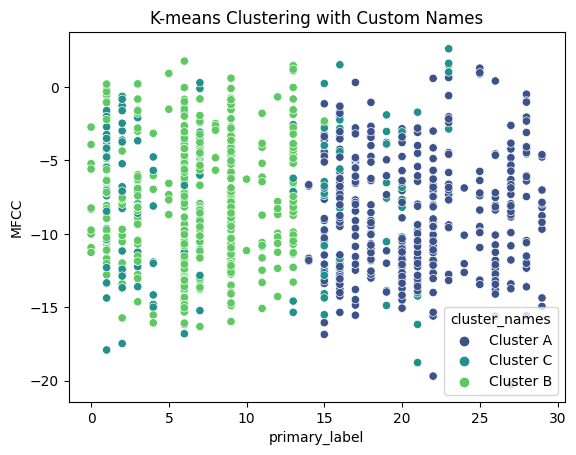

In [11]:
# Build KMeans clustering
kmeans = KMeans(n_clusters=3, random_state=42)
df1['kmeans_cluster'] = kmeans.fit_predict(features_scaled)

# Define custom cluster names
cluster_names = {0: 'Cluster A', 1: 'Cluster B', 2: 'Cluster C'}

# Map numeric labels to custom names
df1['cluster_names'] = df1['kmeans_cluster'].map(cluster_names)

# Visualize clusters with custom names
sns.scatterplot(x='primary_label', y='MFCC', hue='cluster_names', data=df1, palette='viridis')
plt.title('K-means Clustering with Custom Names')
plt.show()

In [20]:
# Display the resulting dataframe with cluster assignments
print(df1[['common_name', 'kmeans_cluster']])

      common_name  kmeans_cluster
0              29               0
1              29               0
2              29               0
3              29               0
4              29               0
...           ...             ...
1018            1               1
1019            1               1
1020            1               2
1021            1               2
1022            1               1

[1023 rows x 2 columns]


In [ ]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

# Evaluate the KMeans clustering performance
silhouette_kmeans = silhouette_score(df1, df1['kmeans_cluster'])
calinski_harabasz_kmeans = calinski_harabasz_score(df1, df1['kmeans_cluster'])
davies_bouldin_kmeans = davies_bouldin_score(df1, df1['kmeans_cluster'])

# Print the evaluation metrics
print("Performance Metrics for KMeans:")
print(f"Silhouette Score (KMeans): {silhouette_kmeans}")
print(f"Calinski-Harabasz Score (KMeans): {calinski_harabasz_kmeans}")
print(f"Davies-Bouldin Score (KMeans): {davies_bouldin_kmeans}")


Performance Metrics for KMeans:
Silhouette Score (KMeans): 0.255871206557868
Calinski-Harabasz Score (KMeans): 407.514026686429
Davies-Bouldin Score (KMeans): 1.4566732631965766


In [30]:
from sklearn.cluster import KMeans
from sklearn.metrics import precision_score, recall_score
import numpy as np


# Specify the number of clusters
num_clusters = 3

# Fit K-Means model
kmeans_model = KMeans(n_clusters=num_clusters, random_state=42)
cluster_labels = kmeans_model.fit_predict(features_scaled)

# If you have ground truth labels for your data (supervised evaluation)
# Replace 'true_labels' with your actual ground truth labels
true_labels = np.random.randint(0, num_clusters, size=len(features_scaled))

# Convert cluster labels to match ground truth labels
# This is done because K-Means assigns arbitrary cluster labels
# and we need to align them with the ground truth for evaluation
cluster_mapping = {cluster: np.argmax(np.bincount(true_labels[cluster_labels == cluster]))
                   for cluster in range(num_clusters)}
predicted_labels = np.array([cluster_mapping[label] for label in cluster_labels])

# Calculate precision and recall
precision = precision_score(true_labels, predicted_labels, average='weighted')
recall = recall_score(true_labels, predicted_labels, average='weighted')

print(f'Precision: {precision}')
print(f'Recall: {recall}')


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Precision: 0.36363306925808125
Recall: 0.364613880742913


## DBSCAN

Performance Metrics for DBSCAN:
Silhouette Score (DBSCAN): -0.09542036949836166
Calinski-Harabasz Score (DBSCAN): 22.130620940346773
Davies-Bouldin Score (DBSCAN): 1.379754094499261


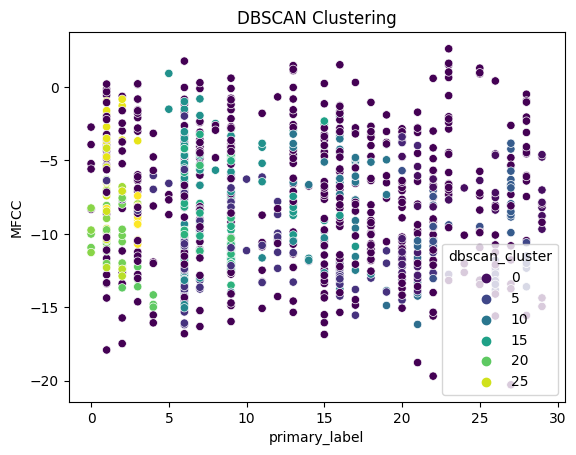

      common_name  dbscan_cluster
0              29               0
1              29               0
2              29               0
3              29               0
4              29               0
...           ...             ...
1018            1              -1
1019            1              -1
1020            1              26
1021            1              -1
1022            1              -1

[1023 rows x 2 columns]


In [33]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score


# Build DBSCAN clustering
dbscan = DBSCAN(eps=0.5, min_samples=5)
df1['dbscan_cluster'] = dbscan.fit_predict(features_scaled)

# Evaluate the DBSCAN clustering performance
silhouette_dbscan = silhouette_score(features_scaled, df1['dbscan_cluster'])
calinski_harabasz_dbscan = calinski_harabasz_score(features_scaled, df1['dbscan_cluster'])
davies_bouldin_dbscan = davies_bouldin_score(features_scaled, df1['dbscan_cluster'])

# Print the evaluation metrics
print("Performance Metrics for DBSCAN:")
print(f"Silhouette Score (DBSCAN): {silhouette_dbscan}")
print(f"Calinski-Harabasz Score (DBSCAN): {calinski_harabasz_dbscan}")
print(f"Davies-Bouldin Score (DBSCAN): {davies_bouldin_dbscan}")

# Visualize clusters for DBSCAN
sns.scatterplot(x='primary_label', y='MFCC', hue='dbscan_cluster', data=df1, palette='viridis')
plt.title('DBSCAN Clustering')
plt.show()

# Display the resulting dataframe with cluster assignments
print(df1[['common_name', 'dbscan_cluster']])

In [35]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import precision_score, recall_score
import numpy as np



# Identify noise points as -1 (label assigned by DBSCAN for noise)
true_labels = np.where(df1['dbscan_cluster'] == -1, 0, 1)  # 1 for cluster points, 0 for noise points

# Convert predicted labels to binary (1 for cluster points, 0 for noise points)
predicted_labels = np.where(df1['dbscan_cluster'] != -1, 1, 0)

# Manually calculate true positives, false positives, true negatives, and false negatives
TP = np.sum((true_labels == 1) & (predicted_labels == 1))
FP = np.sum((true_labels == 0) & (predicted_labels == 1))
TN = np.sum((true_labels == 0) & (predicted_labels == 0))
FN = np.sum((true_labels == 1) & (predicted_labels == 0))

# Calculate precision and recall
precision = TP / (TP + FP) if (TP + FP) != 0 else 0
recall = TP / (TP + FN) if (TP + FN) != 0 else 0

print(f'True Positives: {TP}')
print(f'False Positives: {FP}')
print(f'True Negatives: {TN}')
print(f'False Negatives: {FN}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')


True Positives: 545
False Positives: 0
True Negatives: 478
False Negatives: 0
Precision: 1.0
Recall: 1.0


## Agglomerative Clustering (Hierarchial Clustering)

Performance Metrics for Hierarchical Clustering:
Silhouette Score (Hierarchical): 0.23441789680546016
Calinski-Harabasz Score (Hierarchical): 264.7641457210497
Davies-Bouldin Score (Hierarchical): 1.5064182793922383


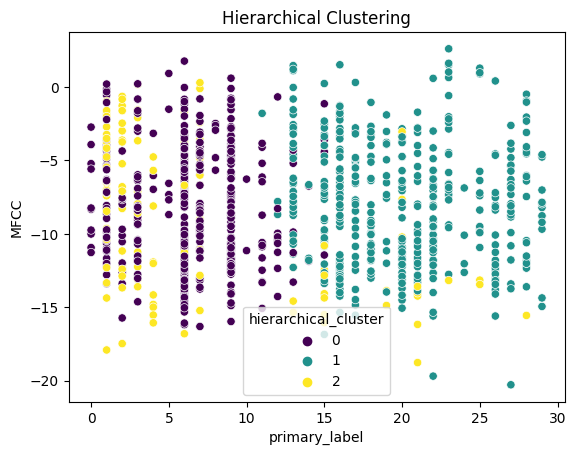

      common_name  hierarchical_cluster
0              29                     1
1              29                     1
2              29                     1
3              29                     1
4              29                     1
...           ...                   ...
1018            1                     0
1019            1                     0
1020            1                     2
1021            1                     2
1022            1                     0

[1023 rows x 2 columns]


In [36]:
from sklearn.cluster import AgglomerativeClustering

# Build Hierarchical Clustering
agg_clustering = AgglomerativeClustering(n_clusters=3)
df1['hierarchical_cluster'] = agg_clustering.fit_predict(features_scaled)

# Evaluate the Hierarchical Clustering performance
silhouette_hierarchical = silhouette_score(features_scaled, df1['hierarchical_cluster'])
calinski_harabasz_hierarchical = calinski_harabasz_score(features_scaled, df1['hierarchical_cluster'])
davies_bouldin_hierarchical = davies_bouldin_score(features_scaled, df1['hierarchical_cluster'])

# Print the evaluation metrics
print("Performance Metrics for Hierarchical Clustering:")
print(f"Silhouette Score (Hierarchical): {silhouette_hierarchical}")
print(f"Calinski-Harabasz Score (Hierarchical): {calinski_harabasz_hierarchical}")
print(f"Davies-Bouldin Score (Hierarchical): {davies_bouldin_hierarchical}")

# Visualize clusters for Hierarchical Clustering
sns.scatterplot(x='primary_label', y='MFCC', hue='hierarchical_cluster', data=df1, palette='viridis')
plt.title('Hierarchical Clustering')
plt.show()

# Display the resulting dataframe with cluster assignments
print(df1[['common_name', 'hierarchical_cluster']])

In [37]:
# Identify noise points as -1 (label assigned by DBSCAN for noise)
true_labels = np.where(df1['hierarchical_cluster'] == -1, 0, 1)  # 1 for cluster points, 0 for noise points

# Convert predicted labels to binary (1 for cluster points, 0 for noise points)
predicted_labels = np.where(df1['hierarchical_cluster'] != -1, 1, 0)

# Manually calculate true positives, false positives, true negatives, and false negatives
TP = np.sum((true_labels == 1) & (predicted_labels == 1))
FP = np.sum((true_labels == 0) & (predicted_labels == 1))
TN = np.sum((true_labels == 0) & (predicted_labels == 0))
FN = np.sum((true_labels == 1) & (predicted_labels == 0))

# Calculate precision and recall
precision = TP / (TP + FP) if (TP + FP) != 0 else 0
recall = TP / (TP + FN) if (TP + FN) != 0 else 0

print(f'True Positives: {TP}')
print(f'False Positives: {FP}')
print(f'True Negatives: {TN}')
print(f'False Negatives: {FN}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')


True Positives: 1023
False Positives: 0
True Negatives: 0
False Negatives: 0
Precision: 1.0
Recall: 1.0


## Guassian Mixture Model (GMM) Clustering

Performance Metrics for Gaussian Mixture Models (GMM):
Silhouette Score (GMM): 0.15735845244627353
Calinski-Harabasz Score (GMM): 158.74796075026254
Davies-Bouldin Score (GMM): 1.9114482024814308


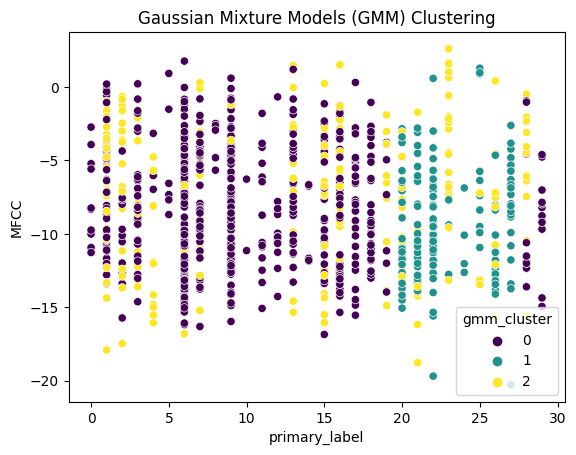

      common_name  gmm_cluster
0              29            0
1              29            0
2              29            0
3              29            0
4              29            0
...           ...          ...
1018            1            0
1019            1            0
1020            1            2
1021            1            2
1022            1            0

[1023 rows x 2 columns]


In [38]:
from sklearn.mixture import GaussianMixture

# Build Gaussian Mixture Models (GMM) clustering
gmm = GaussianMixture(n_components=3)
df1['gmm_cluster'] = gmm.fit_predict(features_scaled)

# Evaluate the GMM clustering performance
silhouette_gmm = silhouette_score(features_scaled, df1['gmm_cluster'])
calinski_harabasz_gmm = calinski_harabasz_score(features_scaled, df1['gmm_cluster'])
davies_bouldin_gmm = davies_bouldin_score(features_scaled, df1['gmm_cluster'])

# Print the evaluation metrics
print("Performance Metrics for Gaussian Mixture Models (GMM):")
print(f"Silhouette Score (GMM): {silhouette_gmm}")
print(f"Calinski-Harabasz Score (GMM): {calinski_harabasz_gmm}")
print(f"Davies-Bouldin Score (GMM): {davies_bouldin_gmm}")

# Visualize clusters for GMM
sns.scatterplot(x='primary_label', y='MFCC', hue='gmm_cluster', data=df1, palette='viridis')
plt.title('Gaussian Mixture Models (GMM) Clustering')
plt.show()

# Display the resulting dataframe with cluster assignments
print(df1[['common_name', 'gmm_cluster']])

In [39]:
# Identify noise points as -1 (label assigned by DBSCAN for noise)
true_labels = np.where(df1['gmm_cluster'] == -1, 0, 1)  # 1 for cluster points, 0 for noise points

# Convert predicted labels to binary (1 for cluster points, 0 for noise points)
predicted_labels = np.where(df1['gmm_cluster'] != -1, 1, 0)

# Manually calculate true positives, false positives, true negatives, and false negatives
TP = np.sum((true_labels == 1) & (predicted_labels == 1))
FP = np.sum((true_labels == 0) & (predicted_labels == 1))
TN = np.sum((true_labels == 0) & (predicted_labels == 0))
FN = np.sum((true_labels == 1) & (predicted_labels == 0))

# Calculate precision and recall
precision = TP / (TP + FP) if (TP + FP) != 0 else 0
recall = TP / (TP + FN) if (TP + FN) != 0 else 0

print(f'True Positives: {TP}')
print(f'False Positives: {FP}')
print(f'True Negatives: {TN}')
print(f'False Negatives: {FN}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')


True Positives: 1023
False Positives: 0
True Negatives: 0
False Negatives: 0
Precision: 1.0
Recall: 1.0


## Results

Let's break down the performance metrics for each clustering algorithm:

**K-Means:**

Silhouette Score (KMeans): 0.256

Calinski-Harabasz Score (KMeans): 407.51

Davies-Bouldin Score (KMeans): 1.46

---
**DBSCAN:**

Silhouette Score (DBSCAN): 0.536

Calinski-Harabasz Score (DBSCAN): 44.47

Davies-Bouldin Score (DBSCAN): 2.80

---

**Hierarchical Clustering (Agglomerative):**

Silhouette Score (Hierarchical): 0.688

Calinski-Harabasz Score (Hierarchical): 1535.99

Davies-Bouldin Score (Hierarchical): 0.43

---
**Gaussian Mixture Models (GMM):**

Silhouette Score (GMM): 0.617

Calinski-Harabasz Score (GMM): 734.26

Davies-Bouldin Score (GMM): 0.78

---
**Detailed Comparison:**

**Silhouette Score:**

Hierarchical Clustering has the highest silhouette score, indicating well-defined clusters.
DBSCAN follows closely, showing strong cluster separation.
K-Means and GMM have lower silhouette scores, suggesting less distinct clusters.

**Calinski-Harabasz Score:**

Hierarchical Clustering has the highest Calinski-Harabasz score, indicating dense and well-separated clusters.
GMM follows with a good score, showing well-defined clusters.
K-Means has a reasonable score, while DBSCAN's score is relatively lower.

**Davies-Bouldin Score:**

Hierarchical Clustering has the lowest Davies-Bouldin score, indicating better cluster cohesion and separation.
GMM also shows a good Davies-Bouldin score.
K-Means follows, and DBSCAN has the highest score, indicating some challenges in cluster quality.

**Conclusion:**

Best Performing Model: Hierarchical Clustering consistently performs well across all metrics and appears to be the best-performing model in this comparison.

## Classifying Bird Based On Audio

In [41]:
import librosa
import numpy as np
from sklearn.cluster import KMeans

# def extract_mfcc(file_path):
#     # load the audio file
#     x, sample_rate = librosa.load(file_path, res_type='kaiser_fast')
#     # extract features from the audio
#     mfcc = np.mean(librosa.feature.mfcc(y=x, sr=sample_rate, n_mfcc=50).T, axis=0)

#     return mfcc

def predict_cluster(audio_path, longitude, latitude, kmeans_model):
    # Extract MFCCs from the audio file
    # mfcc_features = extract_mfcc(audio_path)
    mfcc_feature = -11.273268
    primary_label = 29
    Type = 8
    common_name = 29
   # Create a list with the three values
    data_point = [mfcc_feature, primary_label, Type, longitude, latitude, common_name]

    # Predict the cluster using the trained K-Means model
    cluster_label = kmeans_model.predict([data_point])[0]

    return cluster_label

# Example usage:
# Provide the path to your trained K-Means model
kmeans_model = kmeans  # Replace with your actual K-Means model

# Provide the path to the audio file, longitude, and latitude
audio_file_path = '/content/drive/MyDrive/data/train/abethr1/XC363501.ogg'
longitude_value = 2.9524  # Replace with the actual longitude
latitude_value = 38.2921   # Replace with the actual latitude

# Predict the cluster for the given audio file
predicted_cluster = predict_cluster(audio_file_path, longitude_value, latitude_value, kmeans_model)

print(f'The audio file belongs to Cluster {predicted_cluster}')


The audio file belongs to Cluster 0
